# Terrorism Hotspots

## Import Libraries 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%pip install -q seaborn
import seaborn as sns 
%matplotlib inline
%pip install -q plotly
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter
from IPython.display import HTML
!pip install -q folium
import folium
from folium.plugins import MarkerCluster

import warnings
warnings.filterwarnings('ignore')

## Load Dataset

In [2]:
df = pd.read_csv('/Users/alexborriello/Downloads/globalterrorismdb_0718dist.csv')
df.head(5)

,Unnamed: 0,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [3]:
# Rename the necessary columns
df.rename(columns= {'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country','region_txt':'Region', 'latitude':'Latitude', 'longitude':'Longitude','attacktype1_txt':'Attack_Type','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_Type','weaptype1_txt':'Weapon_Type','motive':'Motive'}, inplace = True)
df['Casualities'] = df.Killed + df.Wounded

df = df[['Year','Month','Day','Country','Region','City','Latitude','Longitude','Attack_Type','Killed','Wounded','Casualities','Target','Group','Target_Type','Weapon_Type']]
df.head(5)

,Year,Month,Day,Country,Region,City,Latitude,Longitude,Attack_Type,Killed,Wounded,Casualities,Target,Group,Target_Type,Weapon_Type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary


In [4]:
#Check for missing data
df.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             435
Latitude        4556
Longitude       4557
Attack_Type        0
Killed         10313
Wounded        16311
Casualities    16874
Target           638
Group              0
Target_Type        0
Weapon_Type        0
dtype: int64

In [ ]:
#Remove the missing data
df.dropna(axis=0, inplace=True)
df.shape

## Yearly Count of Terrorist Attacks

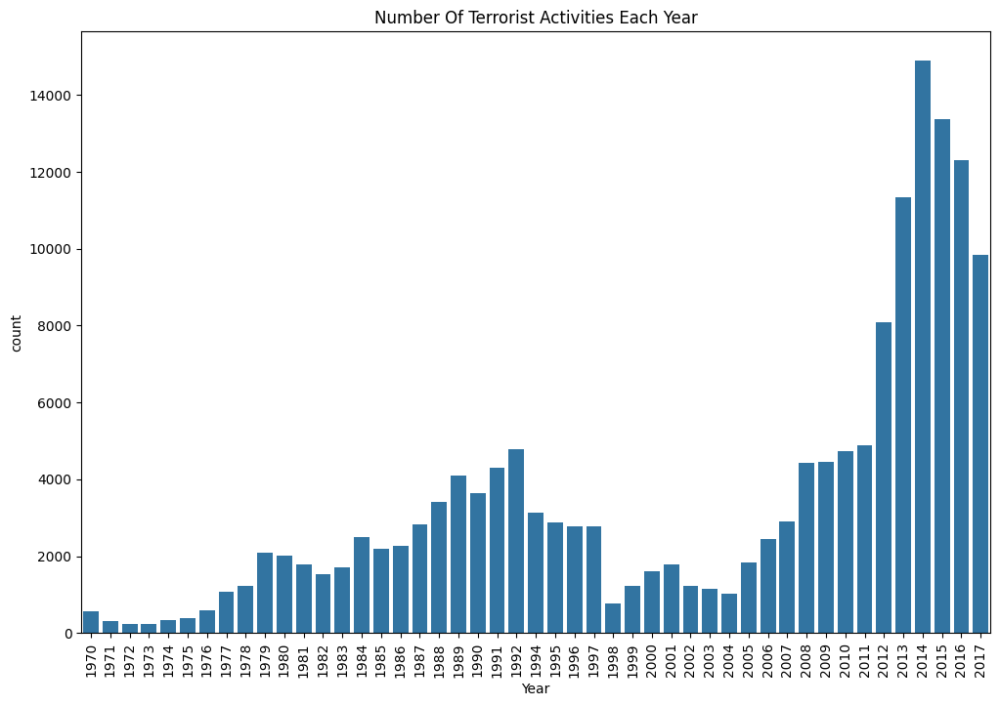

In [6]:
plt.figure(figsize=(12,8))
sns.countplot(x="Year", data=df)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

#### Observation

- A peak in terrorist activities between 2013 and 2017, with the highest point occurring in 2014.
- A consistent upward trend in terrorist activities is evident from 2004 onwards.
- The year 2014 stands out as having the highest recorded number of terror incidents.
- Subsequent to 2014, there is a noticeable decline in terrorist activities.

## Terrorist Activities By Region In Each Year

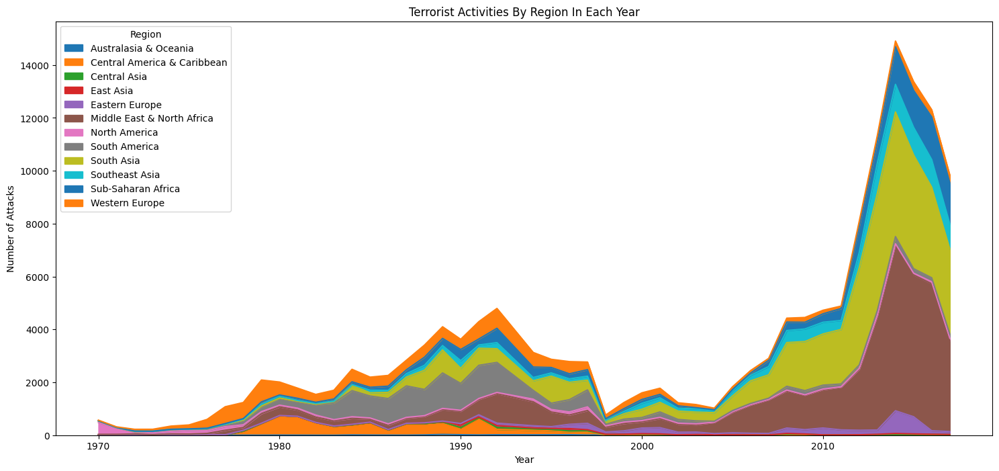

In [7]:
pd.crosstab(df.Year, df.Region).plot(kind='area',figsize=(18,8))
plt.title('Terrorist Activities By Region In Each Year')
plt.ylabel('Number of Attacks')
plt.show()

In [8]:
df['Wounded'] = df['Wounded'].fillna(0).astype(int)
df['Killed'] = df['Killed'].fillna(0).astype(int)
df['casualities'] = df['Killed'] + df['Wounded']

In [9]:
terror_attack = df.sort_values(by ='casualities',ascending = False)[:40]

In [10]:
heat = terror_attack.pivot_table(index ='Country',columns ='Year',values ='casualities')
heat.fillna(0,inplace = True)

In [11]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from IPython.display import Image

colorscale = [[0, '#edf8fb'], [.3, '#A52A2A'], [.6, '#76EE00'], [1, '#008B8B']]

heatmap = go.Heatmap(z=heat.values, x=heat.columns, y=heat.index, colorscale=colorscale)
data = [heatmap]

layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis=dict(title='Year', ticks='', nticks=20),
    yaxis=dict(title='Country', ticks='')
)

fig = go.Figure(data=data, layout=layout)
# fig.write_html('heatmap_chart.html')

# HTML(filename='heatmap_chart.html')

## Regions Affected by the Terrorist Attacks 

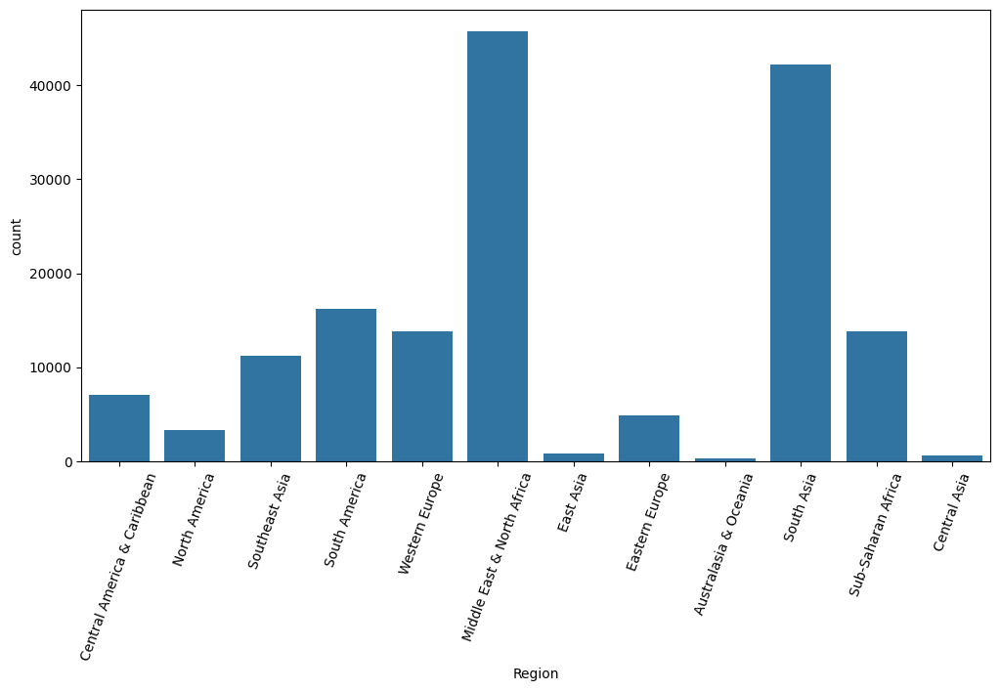

In [12]:
df['Region'].value_counts()
plt.figure(figsize=(12,6
                   ))
sns.countplot(x='Region',data=df)
plt.xticks(rotation=70)
plt.show()

## Yearly Casualities

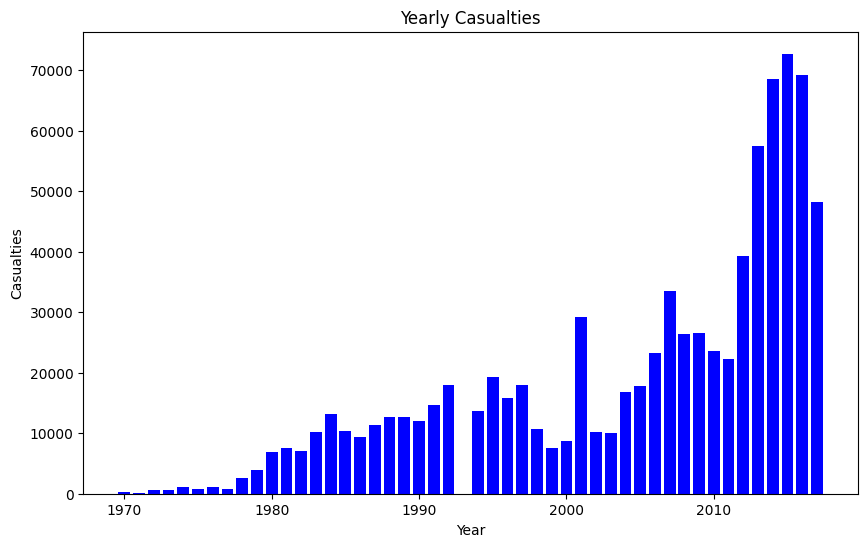

In [13]:
year_cas = df.groupby('Year').Casualities.sum().reset_index()

plt.figure(figsize=(10, 6))
plt.bar(year_cas['Year'], year_cas['Casualities'], color='blue')
plt.xlabel('Year')
plt.ylabel('Casualties')
plt.title('Yearly Casualties')
plt.show()

#### Observation

- 2015 marks the highest casualities records

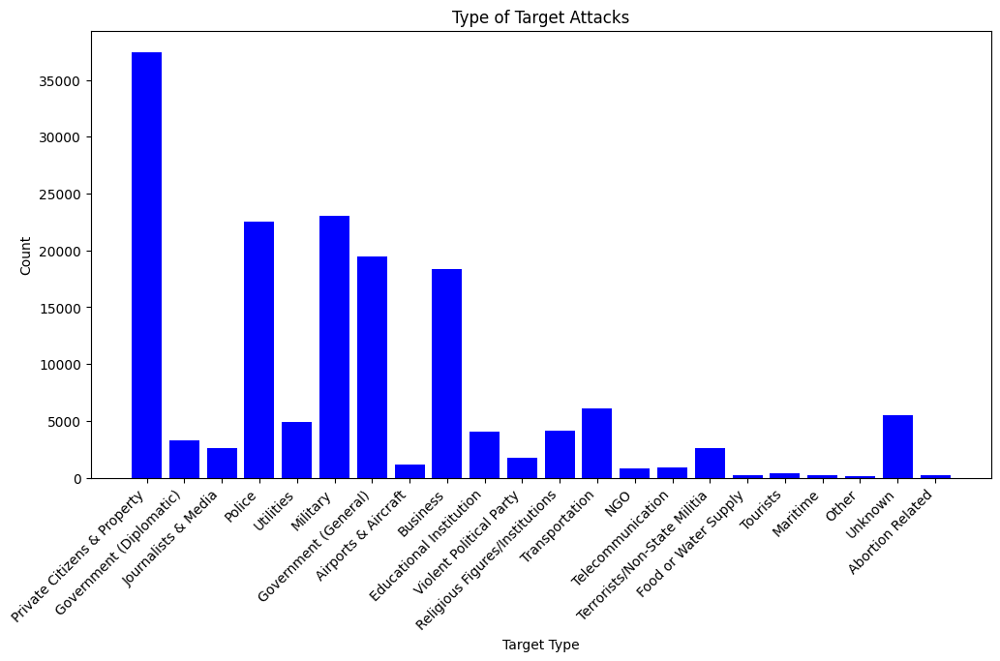

In [14]:
target = list(df['Target_Type'])
target_map = dict(Counter(target))
target_df = pd.DataFrame(list(target_map.items()), columns=['Target Type', 'Count'])

plt.figure(figsize=(12, 6))
plt.bar(target_df['Target Type'], target_df['Count'], color='blue')
plt.xlabel('Target Type')
plt.ylabel('Count')
plt.title('Type of Target Attacks')
plt.xticks(rotation=45, ha='right') 
plt.show()

#### Observation

- Incidents involving private citizens and property represent the highest count among all categories

## Type of Attacks

In [15]:
#Counting the Casualities according to the Attack Type
AttackType=df.pivot_table(columns='Attack_Type',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

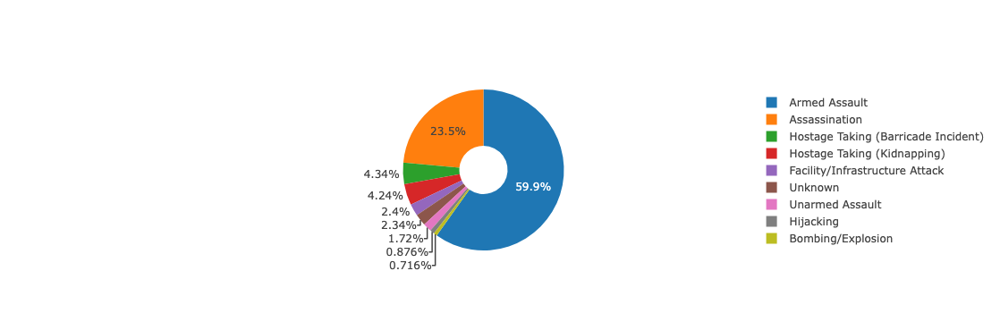

In [16]:
labels = AttackType.columns.tolist()
attack = AttackType.T
values = attack.values.tolist()
values = sum(values, [])
attack_type = list(df['Attack_Type'].unique())

fig = go.Figure(data=[go.Pie(labels=attack_type, values=values, hole=0.3)])
fig.update_layout(template='gridon')
# fig.write_html('attack_type_chart.html')

# HTML(filename='attack_type_chart.html')

## Distribution of Target Types

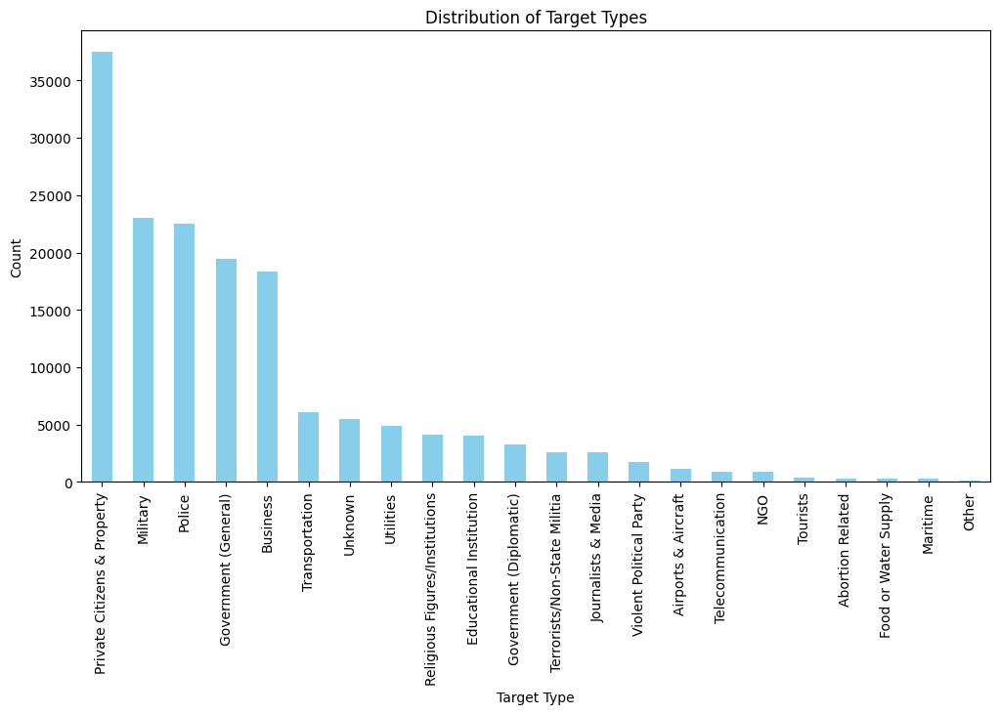

In [17]:
df['Target_Type'].value_counts().plot(kind='bar', figsize=[12, 6], color='skyblue')
plt.title('Distribution of Target Types')
plt.xlabel('Target Type')
plt.ylabel('Count')
plt.show()

## Count of Weapon Types

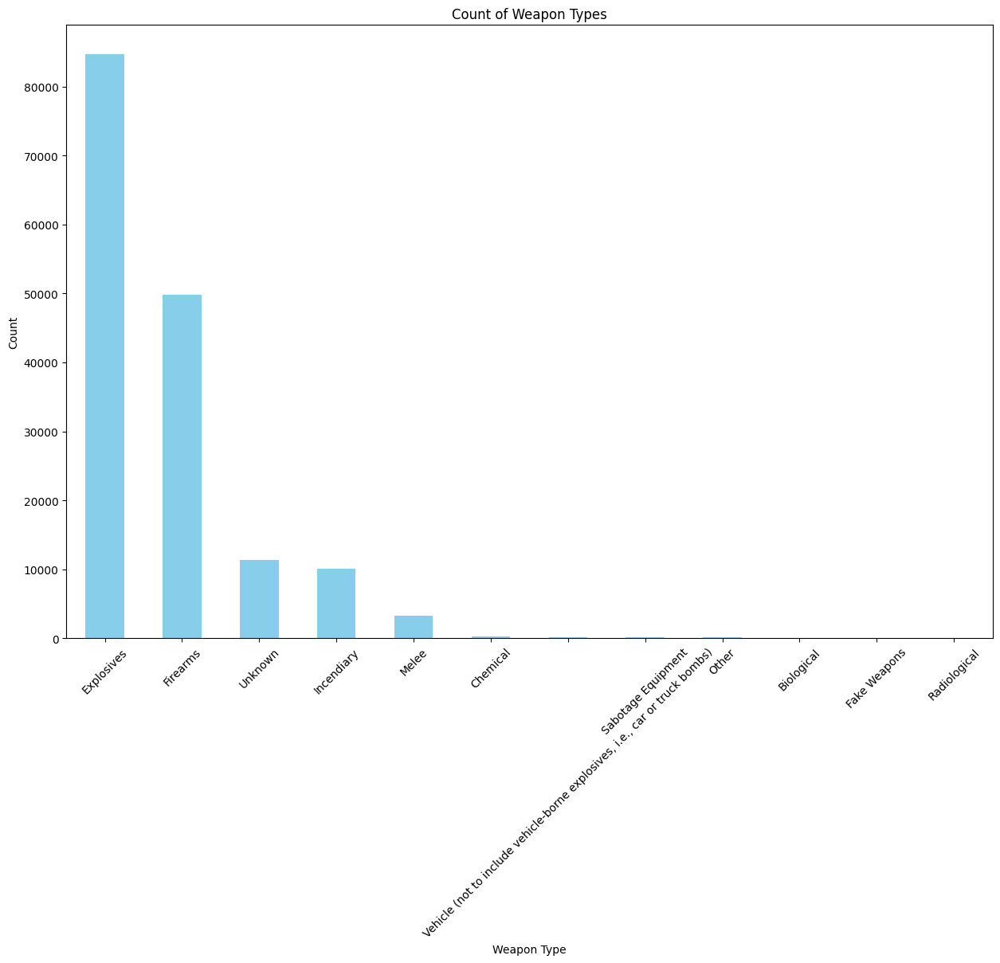

In [18]:
df['Weapon_Type'].value_counts().plot(kind='bar', figsize=[15, 10], color='skyblue', rot=45)
plt.title('Count of Weapon Types')
plt.xlabel('Weapon Type')
plt.ylabel('Count')
plt.show()

## Relationship Between Region and Weapon Types

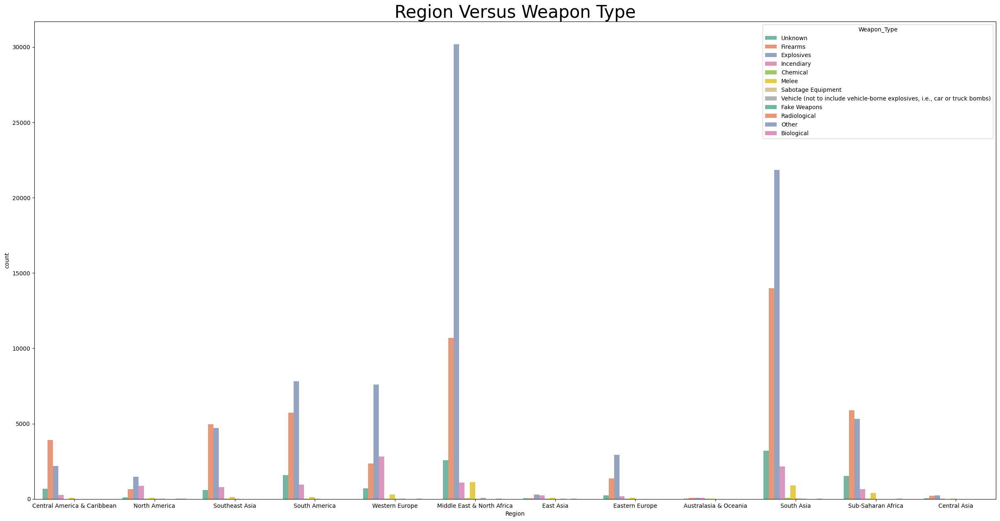

In [19]:
plt.subplots(figsize = (30,15))
sns.countplot(x="Region", hue ='Weapon_Type', data = df,palette = "Set2")
plt.title('Region Versus Weapon Type', fontsize = 30)
plt.show()

## Relationship Between Terrorist Groups and Weapon Types

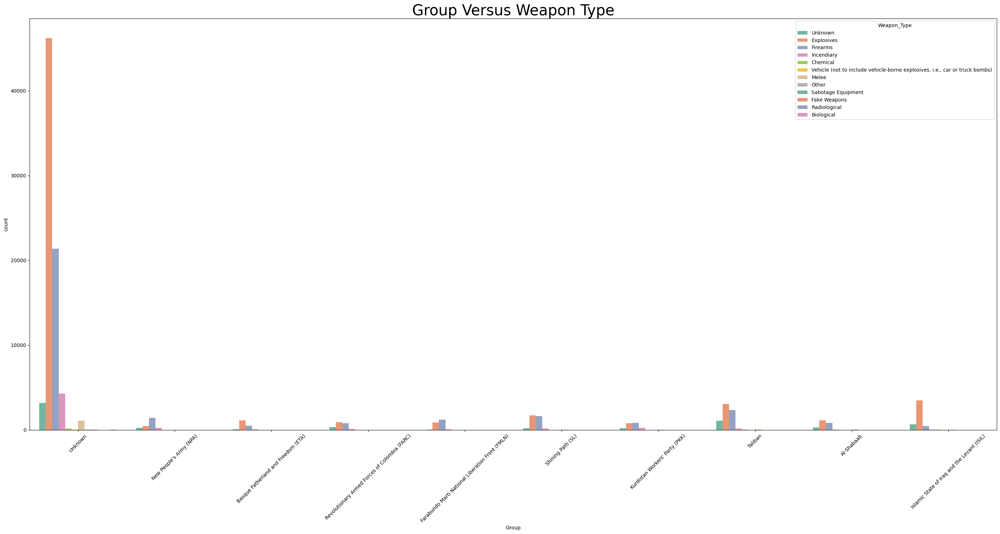

In [20]:
plt.subplots(figsize=(35, 15))

Top_10_Group = df['Group'].value_counts().index.tolist()[0:10]
snap = df[['Group', 'Weapon_Type']]
AttackG_Weapon = snap[snap['Group'].isin(Top_10_Group)]

ax = sns.countplot(x='Group', hue='Weapon_Type', data=AttackG_Weapon, palette='Set2')
ax.tick_params(axis='x', rotation=45)

plt.title('Group Versus Weapon Type', fontsize=30)
plt.show()

## Trend in the Top 10 Terrorist Groups

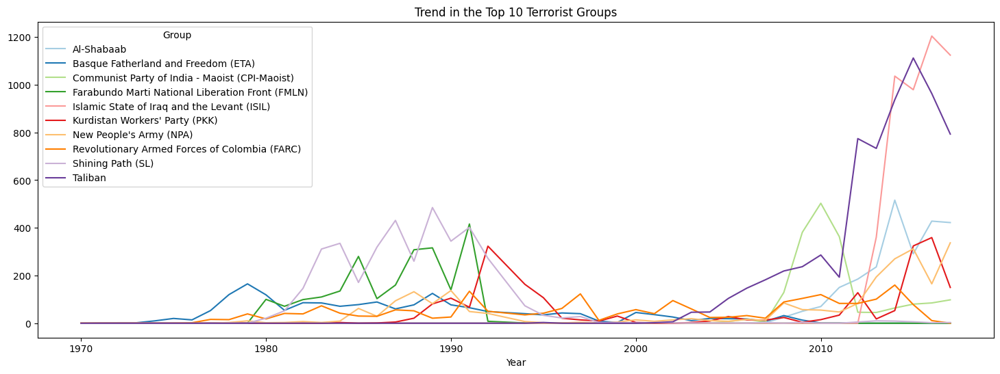

In [21]:
top_groups10=df[df['Group'].isin(df['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',15))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.title("Trend in the Top 10 Terrorist Groups")
plt.show()

## Mapping the Terrorism Hot Zones in the Peak Year of Attacks (2014)

In [22]:
year=df[df['Year']==2014]
mapData=year.loc[:,'City':'Longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)
map

#### Observation

- Bombing and explosion emerges as the predominant method for terrorist attacks

In [23]:
df.Country.value_counts()[:15]

Country
Iraq              23121
Pakistan          13798
Afghanistan       11716
India             11293
Colombia           7262
Philippines        6220
Peru               5091
Turkey             3964
Thailand           3528
El Salvador        3499
United Kingdom     3486
Somalia            3095
Spain              2870
Yemen              2860
Nigeria            2852
Name: count, dtype: int64

## The 15 Countries with the Most Frequent Terrorist Attack

In [24]:
country_attack = df['Country'].value_counts()[:15].reset_index()
country_attack.columns = ["Country", "Total Attacks"]

fig = px.bar(country_attack, x='Country', y='Total Attacks', color='Country', template='plotly_white')
# fig.write_html('country_attack_chart.html')

# HTML(filename='country_attack_chart.html')

#### Observation

- Iraq leads with 23,121 terror attacks, followed by Pakistan with 13,789

## Total Number of Casualities in each Country

In [ ]:
# Counting the Total Number of Casualities in each Country
plt.figure(figsize=(12, 6))
cas_count= df.groupby("Country").Casualities.sum().to_frame().reset_index().sort_values("Casualities", ascending=False)[:15]
fig = px.bar(data_frame=cas_count,x = 'Country',y = 'Casualities',color='Country',template='plotly_white')
# fig.write_html('casualities_chart.html')

# HTML(filename='casualities_chart.html')

#### Observation

- Iraq has the most casualties surpassing the next country, Afganistan, by > 100k casualties

## Terrorist Attacks per Region

In [26]:
region_attacks = df.Region.value_counts().to_frame().reset_index()
region_attacks.columns = ['Region', 'Total Attacks']

fig = px.bar_polar(data_frame=region_attacks,r='Total Attacks',theta='Region',color='Region',template="ggplot2",color_discrete_sequence=px.colors.sequential.Plasma_r)
# fig.write_html('terror_attack_chart.html')

# HTML(filename='terror_attack_chart.html')

#### Observation

- The Middle East & North Africa show the highest terror attack per region followed by South Asia

## Conclusion

- The Middle East and North Africa stand out as hot zones for terrorism, warranting focused attention in these regions.
Countries such as Iraq, Afghanistan, and Pakistan have borne the brunt of terrorist attacks, necessitating heightened awareness and security measures by their governments.
- Terrorists frequently target private citizens, army personnel, and police forces, underscoring the need for enhanced security measures in these areas.
- Bombing and explosive attacks emerge as the most commonly used methods by terrorists, urging governments to strengthen border controls and enforce stringent arms laws.
- A significant number of attacks are attributed to unknown or unaffiliated groups, highlighting the challenge of identifying and countering lone actors or isolated incidents.
- The global community should consider efforts to combat terrorism, particularly since there has been a notable surge in terrorist activities post-2005.